# Setul de date

---



Datele constau din imagini de 48x48 pixeli în tonuri de gri ale fețelor.

Scopul este de a clasifica fiecare față în funcție de emoția afișată în expresia facială într-una dintre cele șapte categorii.

`[0 = Furios, 1 =  Dezgustat, 2 = Înfricoșat, 3 = Fericit, 4 = Trist, 5 = Surprins, 6 = Neutru]`

Setul de date conține două coloane, "emoție" și "pixeli".

Coloana "emoție" conține un cod numeric cuprins între 0 și 6, inclusiv, pentru emoția care este prezentă în imagine.

Coloana "pixeli" conține un șir înconjurat între ghilimele pentru fiecare imagine. Conținutul acestui șir are valori de pixeli separate de spațiu în ordinea majoră a rândurilor.

In [71]:
""" Montăm unitatea Google Drive la sesiunea curentă pentru a permite accesul la
fișierele și directoarele din unitatea Google Drive direct din notebook-ul Colab """


from google.colab import drive
drive.mount('/content/drive')
my_data_folder = ('/content/drive/MyDrive/Licenta/Data/')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [72]:
""" Importarea dependențelor necesare """

# NumPy pentru calcul numeric
# Pandas pentru DataFrame-uri
# Matplotlib pentru vizualizare
# %matplotlib inline pentru afișarea graficelor în notebook
# Seaborn pentru o vizualizare mai ușoară a datelor


import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns

In [73]:
# Citim datele din .csv
df = pd.read_csv(my_data_folder + "fer2013/fer2013.csv")
print("df.shape = ", df.shape, end="\n\n")
print("df = ")
print(df)

df.shape =  (35887, 3)

df = 
       emotion                                             pixels        Usage
0            0  70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...     Training
1            0  151 150 147 155 148 133 111 140 170 174 182 15...     Training
2            2  231 212 156 164 174 138 161 173 182 200 106 38...     Training
3            4  24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...     Training
4            6  4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...     Training
...        ...                                                ...          ...
35882        6  50 36 17 22 23 29 33 39 34 37 37 37 39 43 48 5...  PrivateTest
35883        3  178 174 172 173 181 188 191 194 196 199 200 20...  PrivateTest
35884        0  17 17 16 23 28 22 19 17 25 26 20 24 31 19 27 9...  PrivateTest
35885        3  30 28 28 29 31 30 42 68 79 81 77 67 67 71 63 6...  PrivateTest
35886        2  19 13 14 12 13 16 21 33 50 57 71 84 97 108 122...  PrivateTest

[35887 rows x 3 colum

# Vizualizarea datelor
---

Furios        4953
Dezgustat      547
Infricosat    5121
Fericit       8989
Trist         6077
Surprins      4002
Neutru        6198
Name: emotion, dtype: int64



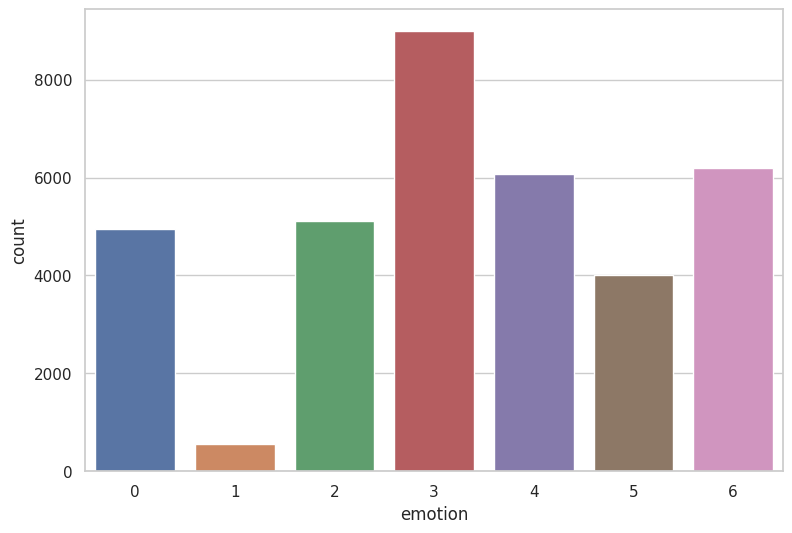

In [74]:
""" Plotarea emoțiilor """

# Definește dimensiunea graficului
plt.figure(figsize = (9, 6))

# Arată numărul de apariții al fiecărei valori din coloana 'emotion'
sns.countplot(x = 'emotion', data = df)

# Numără frecvența fiecărei valori unice din coloana 'emotion', iar apoi le sortează după index
emotion_counts = df['emotion'].value_counts().sort_index()

# Se redenumesc label-urile emoțiilor în română
emotion_labels = {
    0: 'Furios',
    1: 'Dezgustat',
    2: 'Infricosat',
    3: 'Fericit',
    4: 'Trist',
    5: 'Surprins',
    6: 'Neutru'
}

emotion_counts = emotion_counts.rename(emotion_labels)

# Se afișează frecvențele pentru coloana 'emotion'
print(emotion_counts, end="\n\n")

Training       28709
PublicTest      3589
PrivateTest     3589
Name: Usage, dtype: int64

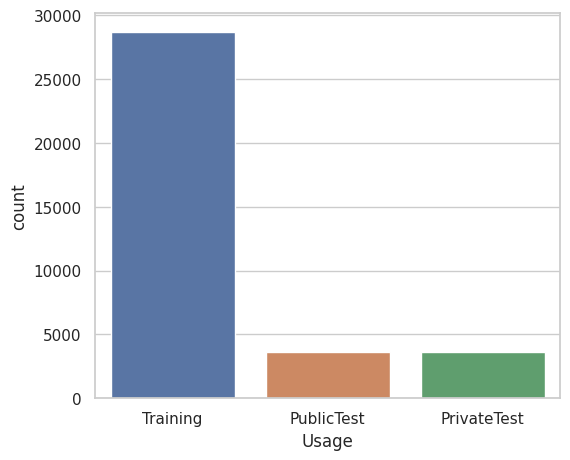

In [75]:
""" Plotarea întrebuințării asociate imaginilor """

# Definește dimensiunea graficului
plt.figure(figsize = (6, 5))

# Arată numărul de apariții al fiecărei valori din coloana 'Usage'
sns.countplot(x = 'Usage', data = df)

# Numără frecvența fiecărei valori unice din coloana 'Usage'
df['Usage'].value_counts()

# Preprocesarea datelor
---

In [64]:
# Extragerae imaginilor și a etichetelor din setul de date
# Conversia elementului de coloană relevant într-o listă pentru fiecare rând
pixels = df['pixels'].tolist()

# Lista utilizată pentru a reține listele cu pixelii fiecărei fețe
# listă va conține toate fețele prelucrate în același format
faces = []

# Iterează prin fiecare secvență de pixeli din lista pixels
for pixel_sequence in pixels:
    # împarte secvența de pixeli într-o listă de valori întregi
    # face = conține valorile pixelilor feței
    face = [int(pixel) for pixel in pixel_sequence.split(' ')]

    # Se adauga lista obținută în lista cu toate fețele
    faces.append(face)

# Conversia listei în matrice numpy
faces = np.asarray(faces, dtype='float32')

# Modificăm forma matricei
# faces.shape[0] = dimensiunea primei axe a matricei faces. Reprezintă numărul de fețe din matrice.
# 48, 48, 1 = noile dimensiuni ale matricei. Se dorește ca fețele să aibă dimensiunea 48x48 pixeli, iar 1 reprezintă numărul de canale.
# În aplicațiile de prelucrare a imaginilor în alb-negru, se folosește de obicei un singur canal.
faces = faces.reshape(faces.shape[0], 48, 48, 1)

# Convertește variabilele categorice într-o reprezentare de tip "one-hot encoding" și returnează rezultatul sub formă de matrice de valori
# "One-hot encoding" este o metodă de transformare a variabilelor categorice într-o reprezentare binară.
# Fiecare categorie unică devine un nou atribut binar, în care valoarea este 1 dacă obiectul de date aparține respectivei categorii și 0 în caz contrar.
# Această reprezentare facilitează prelucrarea datelor categorice în algoritmi de învățare automată și elimină ambiguitatea sau ordinea implicită dintre categorii.
emotions = pd.get_dummies(df['emotion']).values

In [65]:
# Pixelii după preprocesare

print("faces - type: ", type(faces), end="\n\n")
print("faces - shape: ", faces.shape, end="\n\n")
print("faces - dimensions:", faces[0].ndim, end="\n\n")
print("faces[0]: ", faces[0])

faces - type:  <class 'numpy.ndarray'>

faces - shape:  (35887, 48, 48, 1)

faces - dimensions: 3

faces[0]:  [[[ 70.]
  [ 80.]
  [ 82.]
  ...
  [ 52.]
  [ 43.]
  [ 41.]]

 [[ 65.]
  [ 61.]
  [ 58.]
  ...
  [ 56.]
  [ 52.]
  [ 44.]]

 [[ 50.]
  [ 43.]
  [ 54.]
  ...
  [ 49.]
  [ 56.]
  [ 47.]]

 ...

 [[ 91.]
  [ 65.]
  [ 42.]
  ...
  [ 72.]
  [ 56.]
  [ 43.]]

 [[ 77.]
  [ 82.]
  [ 79.]
  ...
  [105.]
  [ 70.]
  [ 46.]]

 [[ 77.]
  [ 72.]
  [ 84.]
  ...
  [106.]
  [109.]
  [ 82.]]]


In [66]:
# Emoțiile după preprocesare

print('emotions - type: ', type(emotions), end="\n\n")
print('emotions - shape: ', emotions.shape, end="\n\n")
print('emotions - dimensions: ', emotions.ndim, end="\n\n")
print('emotions[0]: ', emotions[0])

emotions - type:  <class 'numpy.ndarray'>

emotions - shape:  (35887, 7)

emotions - dimensions:  2

emotions[0]:  [1 0 0 0 0 0 0]


# Împărțirea setului de date în set de antrenare și set de validare
---

In [67]:
# Impartirea datelor in setul de antrenament și de testare
from sklearn.model_selection import train_test_split

# funcția train_test_split împărte setul de date 'faces' și etichetele corespunzătoare 'emotions' în seturi separate de antrenament și test.
# Parametrul test_size = 0.2 specifică proporția datelor care vor fi alocate setului de test, în acest caz 20%.
# Parametrul random_state = 32 asigură reproductibilitatea împărțirii setului de date, astfel încât împărțirea să fie aceeași în fiecare rulare.
# X_train și y_train reprezintă setul de antrenament.
# X_test și y_test reprezintă setul de test.

X_train, X_test, y_train, y_test = train_test_split(faces, emotions, test_size = 0.2, random_state = 32)

print('Training Pixels = ', X_train.shape, end="\n\n")
print('Training Labels = ', y_train.shape, end="\n\n")
print('Testing Pixels = ', X_test.shape, end="\n\n")
print('Testing Labels = ', y_test.shape, end="\n\n")

Training Pixels =  (28709, 48, 48, 1)

Training Labels =  (28709, 7)

Testing Pixels =  (7178, 48, 48, 1)

Testing Labels =  (7178, 7)



# Definirea modelului
---

In [68]:
""" Importarea dependențelor necesare pentru a construi modelul """

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.utils import plot_model

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 46, 46, 32)        320       
                                                                 
 conv2d_9 (Conv2D)           (None, 44, 44, 64)        18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 22, 22, 64)       0         
 2D)                                                             
                                                                 
 dropout_8 (Dropout)         (None, 22, 22, 64)        0         
                                                                 
 flatten_4 (Flatten)         (None, 30976)             0         
                                                                 
 dense_8 (Dense)             (None, 128)               3965056   
                                                      

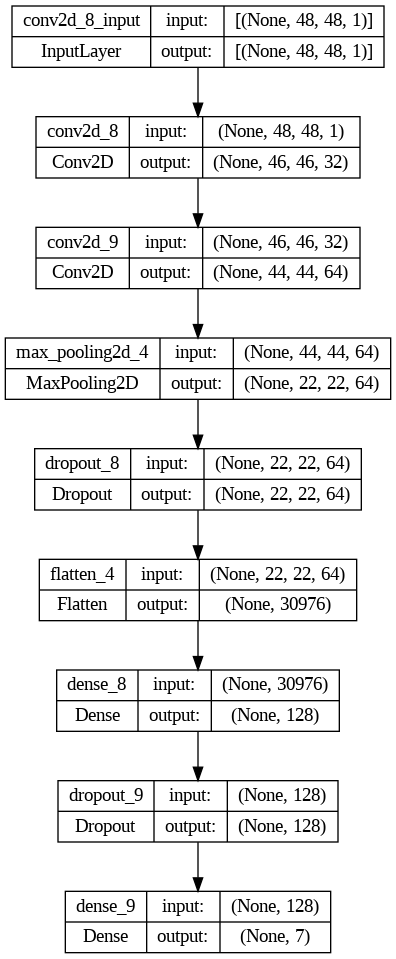

In [69]:
""" Construirea arhitecturii modelului """

# Reprezintă dimensiunea imaginilor de intrare.
input_shape=(48, 48, 1)

# Reprezintă numărul de clase sau categorii distincte în problema de clasificare. Numărul de expresii faciale.
num_classes = 7

# Se definește un model secvențial gol, care va conține toate straturile rețelei neuronale.
model = Sequential()

# Se adaugă primul strat Conv2D la model, cu 32 de filtre, o dimensiune de kernel de 3x3 și o funcție de activare ReLU.
# Acest strat primește input_shape, care reprezintă dimensiunea imaginilor de intrare.
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape))

# Se adaugă al doilea strat Conv2D, cu 64 de filtre, o dimensiune de kernel de 3x3 și o funcție de activare ReLU.
model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))

# Se adaugă un strat de pooling MaxPooling2D, cu o dimensiune de pool de 2x2.
# Acest strat reduce dimensiunea imaginilor prin extragerea valorilor maxime din fiecare regiune de 2x2.
model.add(MaxPooling2D(pool_size=(2, 2)))

# Se adaugă un strat de dropout cu o rată de 0.25. Dropout este o tehnică de regularizare
# care ajută la evitarea suprapunerii (overfitting) prin "renunțarea" aleatoare la neuroni în timpul antrenării.
model.add(Dropout(0.25))

# Se adaugă un strat Flatten, care transformă tensorul multidimensional rezultat într-un vector unidimensional,
# pregătind datele pentru straturile complet conectate (fully connected).
model.add(Flatten())

# Se adaugă un strat complet conectat cu 128 de neuroni și o funcție de activare ReLU.
model.add(Dense(128, activation='relu'))

# Se adaugă un strat de dropout cu o rată de 0.5 pentru a preveni suprapunerea.
model.add(Dropout(0.5))

# Se adaugă un strat complet conectat final cu numărul de neuroni egal cu numărul de clase în problema de clasificare.
# Acest strat utilizează funcția de activare softmax pentru a obține probabilitățile asociate cu fiecare clasă.
model.add(Dense(num_classes, activation='softmax'))

# Afișează un rezumat al modelului, care prezintă numărul de parametri și dimensiunile fiecărui strat.
model.summary()


# Afișează graficul rețelei
plot_model(model, to_file = my_data_folder + 'model.png', show_shapes = True, show_layer_names = True)

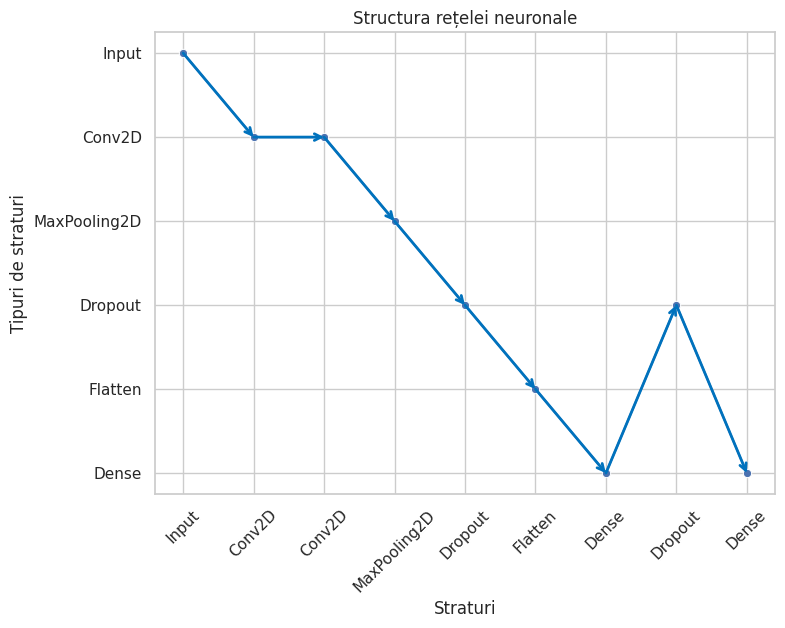

<Figure size 640x480 with 0 Axes>

In [70]:
# Definirea structurii rețelei
layers = ['Input', 'Conv2D', 'Conv2D', 'MaxPooling2D', 'Dropout', 'Flatten', 'Dense', 'Dropout', 'Dense']
connections = [(0, 1), (1, 2), (2, 3), (3, 4), (4, 5), (5, 6), (6,7), (7,8)]

# Crearea graficului
sns.set(style = 'whitegrid')

# Crearea obiectelor pentru figură și axă
fig, ax = plt.subplots(figsize=(8, 6))

# Crearea graficului linie
g = sns.lineplot(x = range(len(layers)), y = [layer for layer in layers], ax=ax, marker='o')

# Adăugarea săgeților pentru conexiunile între straturi
for connection in connections:
    ax.annotate("", xy=(connection[1], layers[connection[1]]), xytext=(connection[0], layers[connection[0]]),
                arrowprops=dict(arrowstyle="->", color='#0072BD', lw=2, shrinkA=0, shrinkB=0))

# Personalizarea graficului
ax.set_xticks(range(len(layers)))
ax.set_xticklabels(layers, rotation=45)
ax.set_xlabel('Straturi')
ax.set_ylabel('Tipuri de straturi')
ax.set_title('Structura rețelei neuronale')

# Afișarea graficului
plt.show()

# Antrenarea modelului
---

In [76]:
""" Parametri """
batch_size = 64  # Numărul de eșantioane dintr-o epocă
num_epochs = 200 # Numărul de epoci pentru antrenamentul modelului.
verbose = 1      # Bară de progres pe epoci

# Configurează modelul pentru antrenare.
# Se specifică optimizerul, "adam" este o metodă populară de optimizare a gradientului stochastic.
# Se specifică funcția de pierdere, care este "categorical_crossentropy" deoarece avem clasificare multi-clasă și
# se dorește să se compare distribuția de probabilități a predicțiilor cu cea a etichetelor reale.
# Se specifică metricile pe baza cărora se evaluează performanța modelului, în acest caz, "accuracy" (acuratețea).
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

# Antrenează modelul folosind datele de antrenare și de testare.
# X_train = reprezintă caracteristicile de antrenare.
# y_train = reprezintă etichetele de antrenare.
# epochs = specifică numărul de epoci (iterații) de antrenare.
# verbose = controlează modul în care se afișează progresul antrenării.
# batch_size = specifică dimensiunea loturilor de date folosite în timpul antrenării.
# validation_data = reprezintă datele de validare (de testare în timpul antrenării) folosite pentru a evalua performanța modelului în fiecare epocă.
history = model.fit(X_train,
                    y_train,
                    epochs = num_epochs,
                    verbose = verbose,
                    batch_size = batch_size,
                    validation_data = (X_test, y_test))

Epoch 1/200
449/449 [==============================] - 8s 14ms/step - loss: 4.8108 - accuracy: 0.2640 - val_loss: 1.6823 - val_accuracy: 0.3671
Epoch 2/200
449/449 [==============================] - 5s 12ms/step - loss: 1.6675 - accuracy: 0.3353 - val_loss: 1.5343 - val_accuracy: 0.3962
Epoch 3/200
449/449 [==============================] - 6s 13ms/step - loss: 1.5939 - accuracy: 0.3695 - val_loss: 1.5193 - val_accuracy: 0.4248
Epoch 4/200
449/449 [==============================] - 6s 13ms/step - loss: 1.5385 - accuracy: 0.3978 - val_loss: 1.4768 - val_accuracy: 0.4363
Epoch 5/200
449/449 [==============================] - 6s 13ms/step - loss: 1.4662 - accuracy: 0.4288 - val_loss: 1.4335 - val_accuracy: 0.4483
Epoch 6/200
449/449 [==============================] - 5s 12ms/step - loss: 1.4064 - accuracy: 0.4513 - val_loss: 1.4365 - val_accuracy: 0.4497
Epoch 7/200
449/449 [==============================] - 6s 13ms/step - loss: 1.3456 - accuracy: 0.4748 - val_loss: 1.4086 - val_accuracy:

In [77]:
# Evaluarea performanței modelului
score = model.evaluate(X_test, y_test, verbose = 1)
print('Test loss: ', score[0], end="\n\n")
print('Test accuracy: ', score[1]*100)

225/225 [==============================] - 1s 4ms/step - loss: 2.6487 - accuracy: 0.4937
Test loss:  2.648745059967041

Test accuracy:  49.37308430671692


In [78]:
# Evaluarea performanței modelului pe datele de antrenare
score = model.evaluate(X_train, y_train, verbose = 1)
print('Train loss: ', score[0], end="\n\n")
print('Train accuracy: ', score[1]*100)

898/898 [==============================] - 3s 4ms/step - loss: 0.0109 - accuracy: 0.9968
Train loss:  0.010881390422582626

Train accuracy:  99.68302845954895


# Istoricul antrenării modelului

In [79]:
""" Metrice colectate de obiectul history """

history_dict = history.history
history_dict.keys()

print(history_dict["accuracy"])

[0.26395905017852783, 0.3352607190608978, 0.36946600675582886, 0.39778468012809753, 0.4288202226161957, 0.4512522220611572, 0.4748336672782898, 0.5022814869880676, 0.5309484601020813, 0.5518826842308044, 0.5741056799888611, 0.5961893200874329, 0.621686577796936, 0.6347138285636902, 0.64937824010849, 0.6702427864074707, 0.6827475428581238, 0.7003378868103027, 0.7126336693763733, 0.7280992269515991, 0.7332892417907715, 0.7416489720344543, 0.754989743232727, 0.7564178705215454, 0.769236147403717, 0.7723710536956787, 0.7762025594711304, 0.7886725664138794, 0.7937580347061157, 0.7976940870285034, 0.8046257495880127, 0.810512363910675, 0.8093280792236328, 0.8162596821784973, 0.8231913447380066, 0.8224946856498718, 0.8313769102096558, 0.8311330676078796, 0.8362882733345032, 0.8392490148544312, 0.8406423330307007, 0.8445435166358948, 0.8472256064414978, 0.8413389325141907, 0.850290834903717, 0.8561426997184753, 0.8526594638824463, 0.858476459980011, 0.8661743998527527, 0.8589292764663696, 0.85

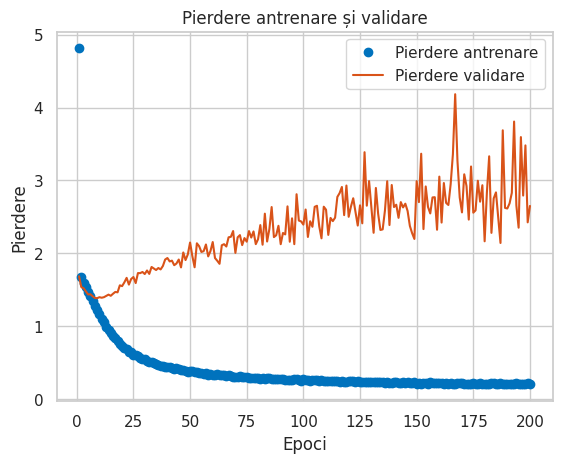

In [80]:
""" Vizualizarea istoricului antrenării modelului """

import matplotlib.pyplot as plt

color_train = '#0072BD'  # Albastru
color_val = '#D95319'    # Portocaliu

train_loss = history_dict['loss']  # Valorile pierderii de antrenare
val_loss = history_dict['val_loss']  # Valorile pierderii de validare

epochs = range(1, len(history_dict['accuracy']) + 1) # Numărul de epoci

# Trasare puncte pentru pierderea de antrenare
plt.plot(epochs, train_loss, 'o', color=color_train, label='Pierdere antrenare')
# Trasare linie pentru pierderea de validare
plt.plot(epochs, val_loss, color=color_val, label='Pierdere validare')
plt.title('Pierdere antrenare și validare')  # Titlul graficului
plt.xlabel('Epoci')  # Eticheta axei x
plt.ylabel('Pierdere')  # Eticheta axei y
plt.legend()  # Afișarea legendei
plt.show()  # Afișarea graficului

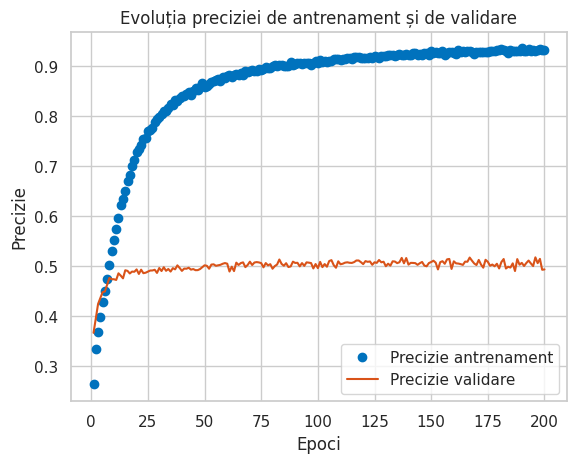

In [81]:
train_acc = history_dict['accuracy'] # Valorile preciziei de antrenare
val_acc = history_dict['val_accuracy']  # Valorile preciziei de validare

# Trasare puncte pentru precizia de antrenare
plt.plot(epochs, train_acc, 'o', color=color_train, label='Precizie antrenament')
# Trasare linie pentru precizia de validare
plt.plot(epochs, val_acc, color=color_val, label='Precizie validare')
plt.title('Evoluția preciziei de antrenament și de validare') # Titlul graficului
plt.xlabel('Epoci') # Eticheta axei x
plt.ylabel('Precizie') # Eticheta axei y
plt.legend() # Afișarea legendei
plt.show() # Afișarea graficului

# Savarea modelului

In [ ]:
from keras.models import model_from_json

version = "model_v2"
def save_model(version):
    # Se serializează modelul în format JSON
    model_json = model.to_json()
    with open(my_data_folder + "model/" + version + ".json", "w") as json_file:
        json_file.write(model_json)

    # Se salvează greutățile modelului în format HDF5
    model.save_weights(my_data_folder + "model/" + version + ".h5")
    print("Modelul a fost salvat!")

save_model(version)

# Încărcarea modelului

In [88]:
def load_model(version):
    # Se deschide fișierul JSON care conține definirea modelului
    json_file = open(my_data_folder + "model/" + version + ".json", 'r')
    loaded_model_json = json_file.read()
    json_file.close()

    # Se crează modelul pe baza definirii din fișierul JSON
    model = model_from_json(loaded_model_json)

    # Se încărcă greutățile modelului în modelul creat
    model.load_weights(my_data_folder + "model/" + version + ".h5")

    print("Modelul a fost încărcat!")
    return model

model = load_model("model_v2")

Modelul a fost încărcat!


# Testarea modelului

In [89]:
from google.colab.patches import cv2_imshow
import cv2

def predict_from_image(path):
    # Se încarcă un clasificator Haar Cascade pentru detectarea fețelor.
    # Clasificatorul Haar Cascade este un algoritm popular utilizat pentru detectarea obiectelor în imagini.
    # Se încarcă clasificatorul pentru detectarea fețelor frontale.
    # Clasificatorul conține informații despre caracteristicile feței umane și este utilizat pentru a localiza regiunile care pot conține fețe în imagine.
    facecasc = cv2.CascadeClassifier( my_data_folder + 'haarcascade_frontalface_default.xml')
    image_path = my_data_folder + path

    # Se citeste imaginea
    image = cv2.imread(image_path)
    # Se convertește imaginea din format BGR în formatul grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Detectează fețele în imaginea în tonuri de gri folosind clasificatorul în cascada pentru fețe.
    faces = facecasc.detectMultiScale(gray, scaleFactor = 1.3, minNeighbors = 10)
    print("Numărul de fețe din imagine: ",len(faces))
    i = 1
    for (x, y, w, h) in faces:
        # Se desenează un dreptunghi roșu în jurul feței.
        cv2.rectangle(image, (x, y), (x+w, y+h), (0, 0, 255), 6)
        # Se selectează regiunea de interes (ROI) a feței din imaginea în tonuri de gri.
        roi_gray = gray[y:y + h, x:x + w]
        # Se redimensionează ROI-ul la dimensiunea 48x48 pixeli și ajustează dimensiunile pentru a se potrivi cu modelul.
        cropped_img = np.expand_dims(np.expand_dims(cv2.resize(roi_gray, (48, 48)), -1), 0)
        # Se realizează predicția emoției folosind modelul.
        prediction = model.predict(cropped_img)
        # Se obține indexul emoției cu cea mai mare probabilitate din vectorul de predicții.
        maxindex = int(np.argmax(prediction))
        # Afișează emoția asociată feței în consolă.
        print("Persoana: ",i," : ", emotion_labels[maxindex])
        # Se scrie eticheta emoției pe imagine.
        cv2.putText(image, str(i) + '-' + emotion_labels[maxindex], (x + 10, y - 20), cv2.FONT_HERSHEY_COMPLEX, 1.5, (255, 255, 255), 2)
        # Se incrementează numărul persoanei pentru a afișa corespunzător.
        i+=1
    # Se afișează imaginea prelucrată
    cv2_imshow(image)

Procesează imaginea: images/test/test_1.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 17ms/step
Persoana:  1  :  Furios


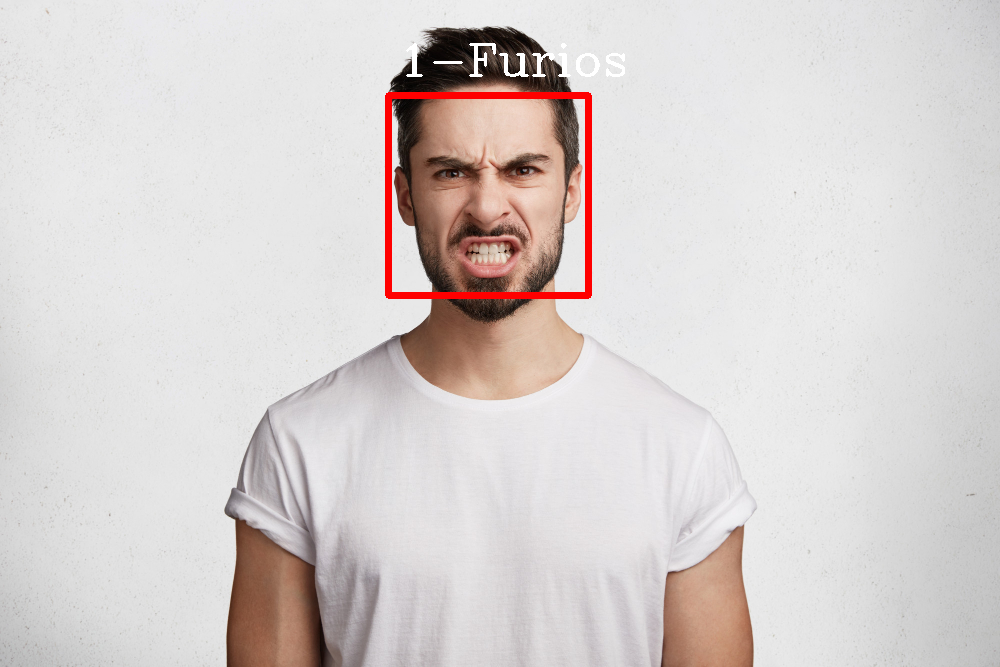

Procesează imaginea: images/test/test_2.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 20ms/step
Persoana:  1  :  Neutru


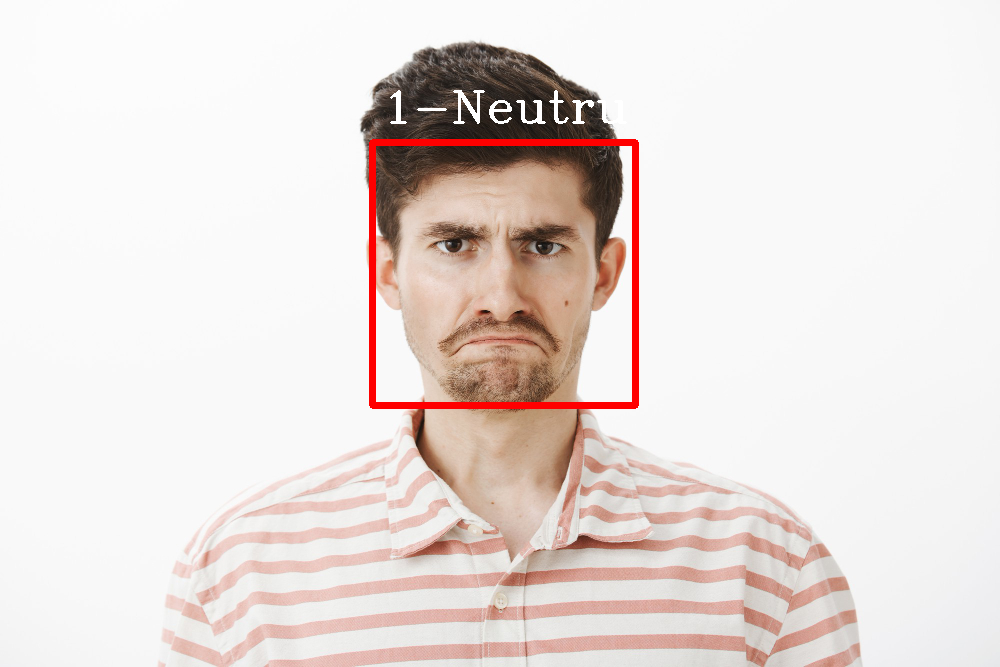

Procesează imaginea: images/test/test_3.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 26ms/step
Persoana:  1  :  Infricosat


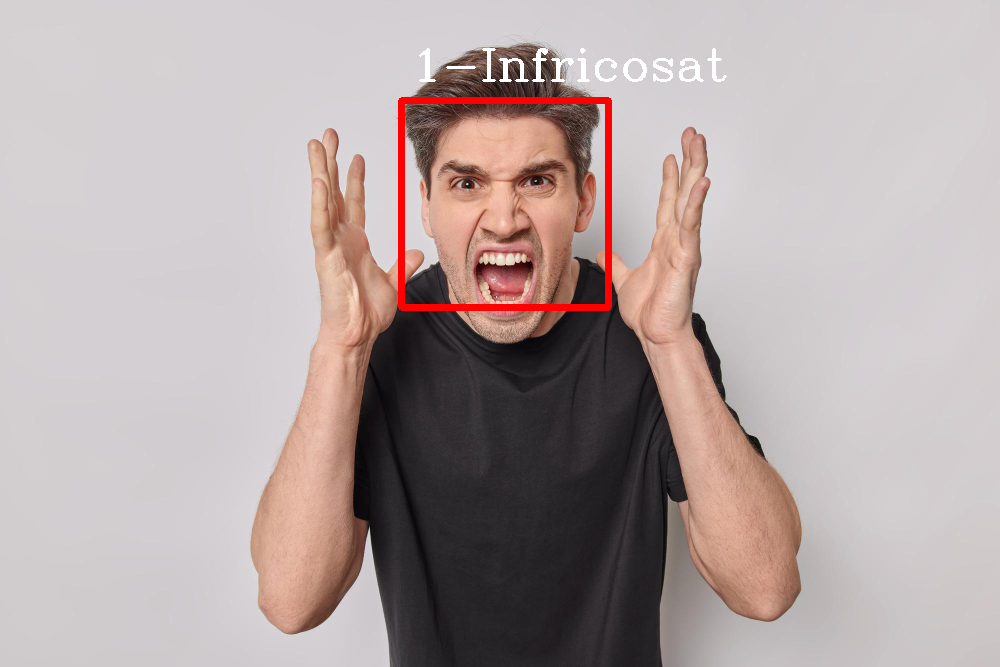

Procesează imaginea: images/test/test_4.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 19ms/step
Persoana:  1  :  Fericit


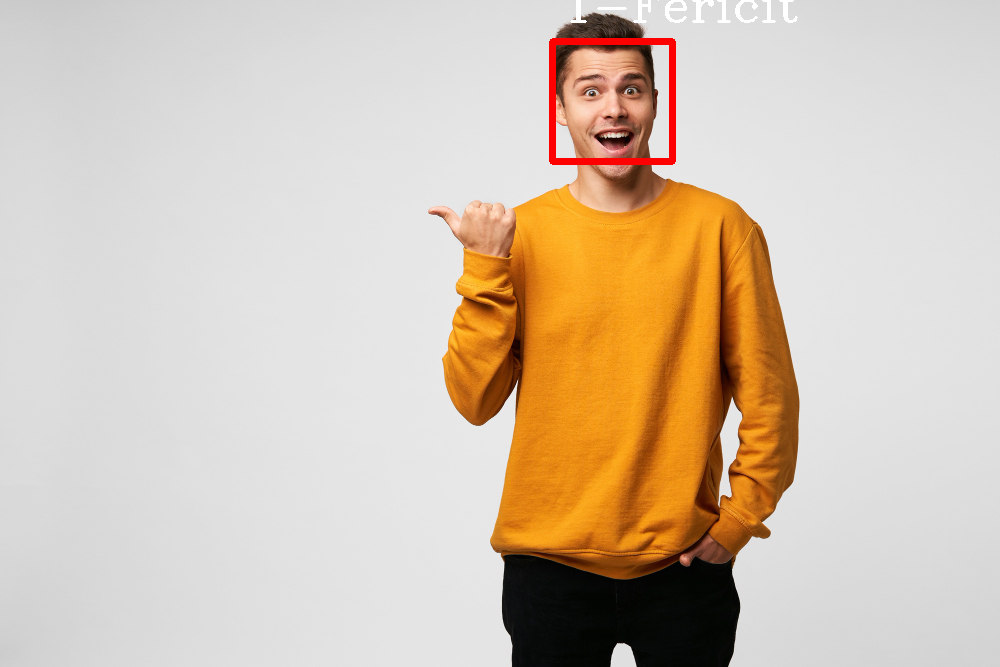

Procesează imaginea: images/test/test_5.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 17ms/step
Persoana:  1  :  Neutru


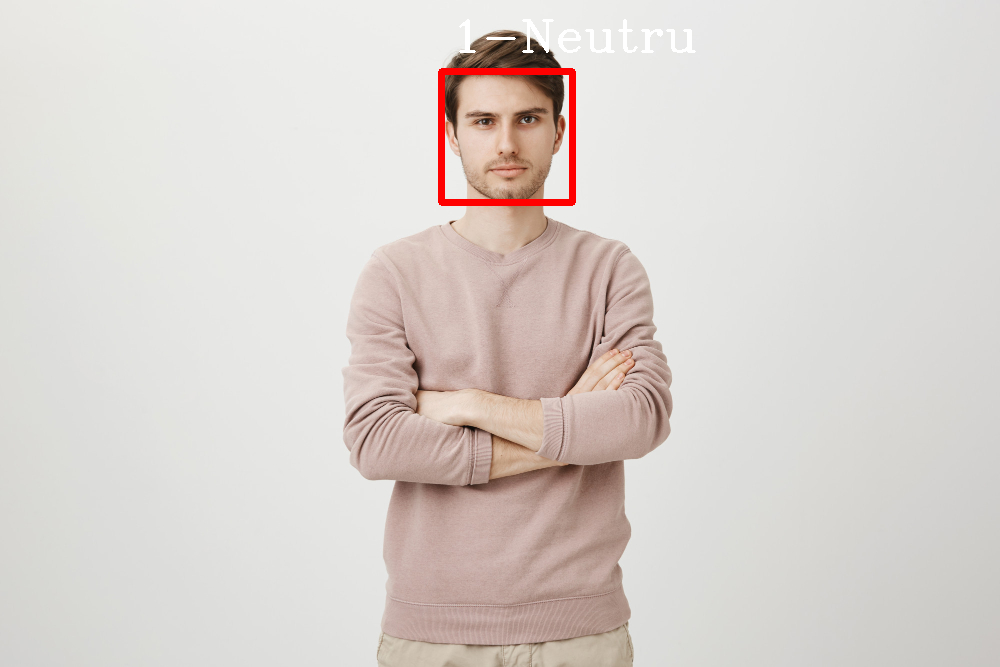

Procesează imaginea: images/test/test_6.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 26ms/step
Persoana:  1  :  Furios


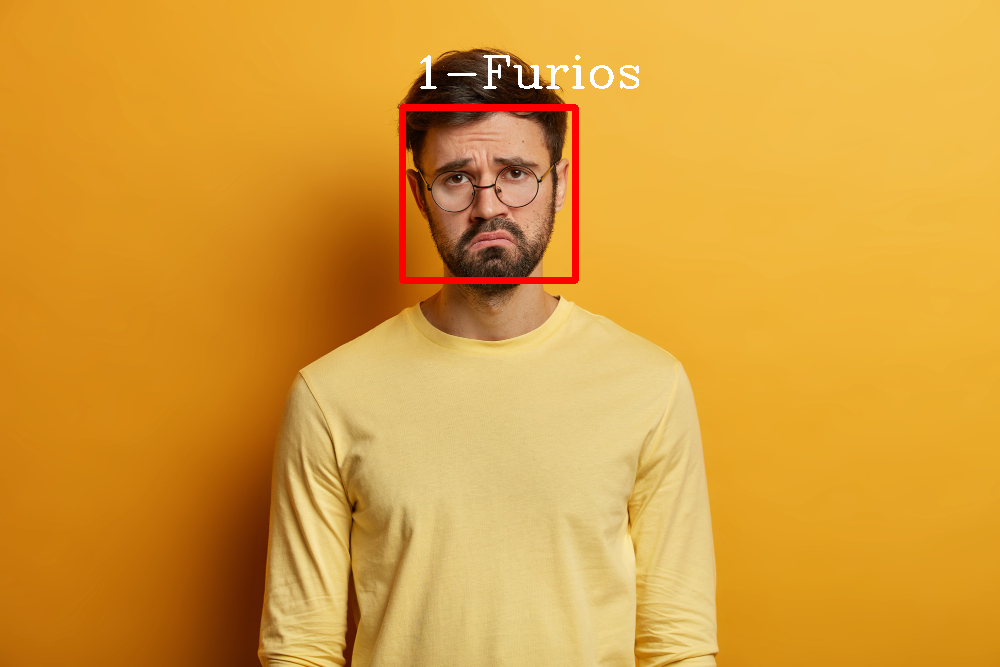

Procesează imaginea: images/test/test_7.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 29ms/step
Persoana:  1  :  Surprins


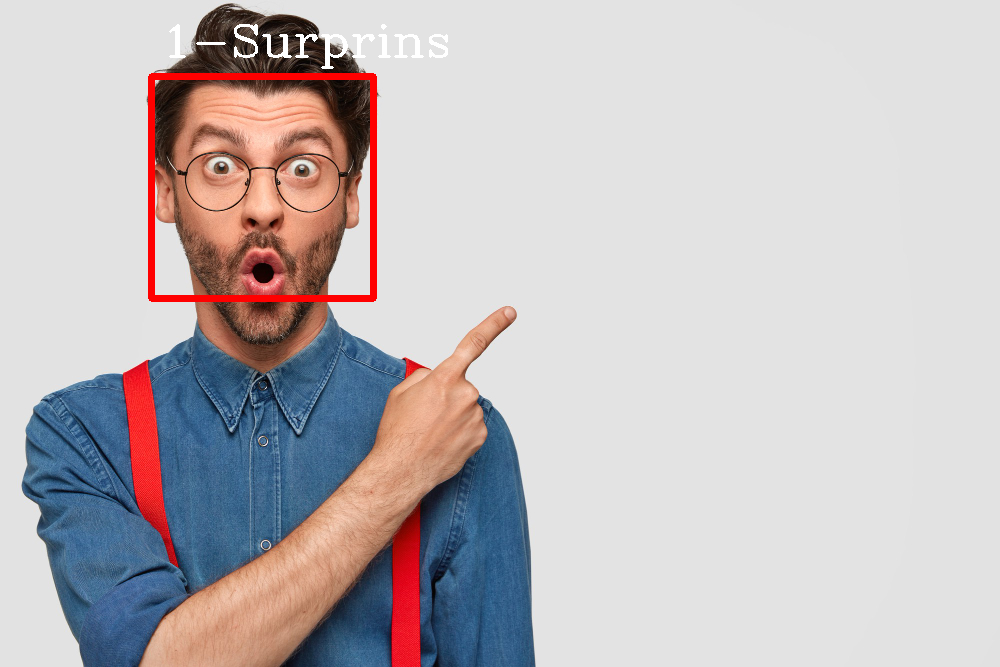

Procesează imaginea: images/test/test_8.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 27ms/step
Persoana:  1  :  Furios


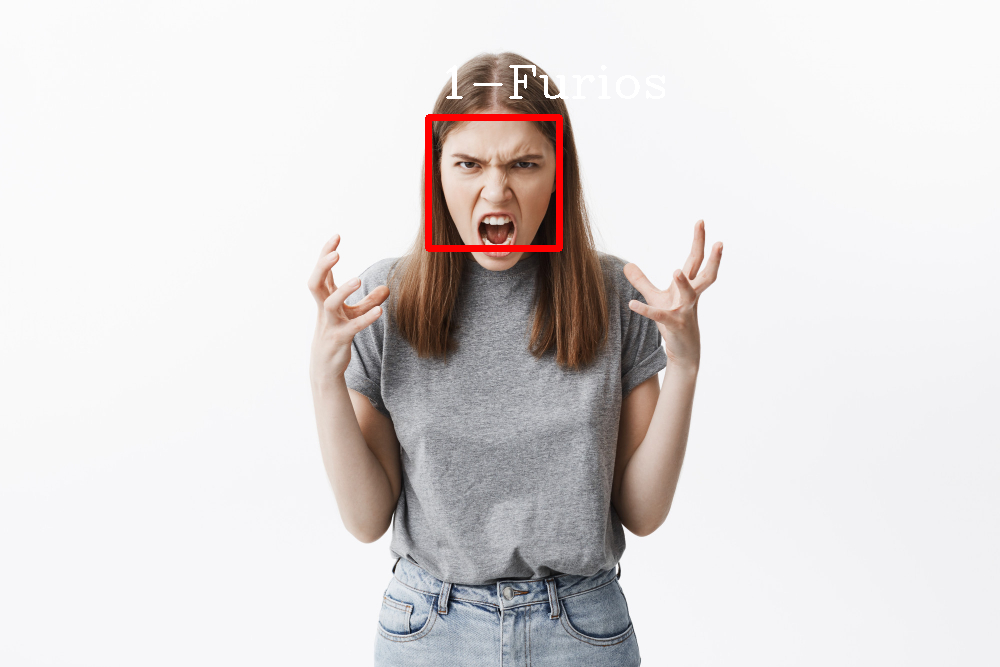

Procesează imaginea: images/test/test_9.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 26ms/step
Persoana:  1  :  Neutru


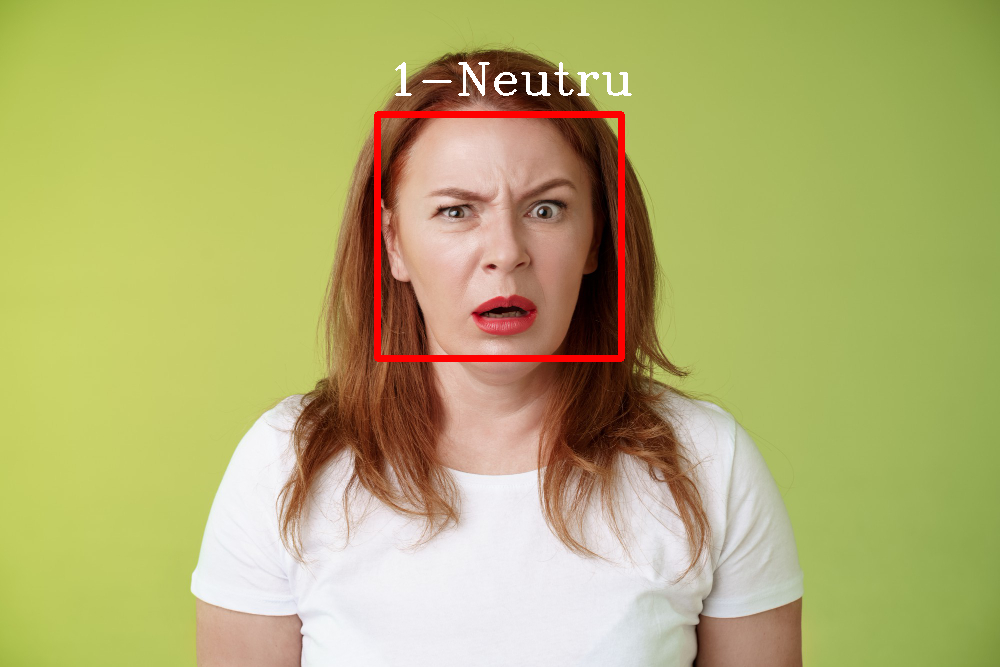

Procesează imaginea: images/test/test_10.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 42ms/step
Persoana:  1  :  Neutru


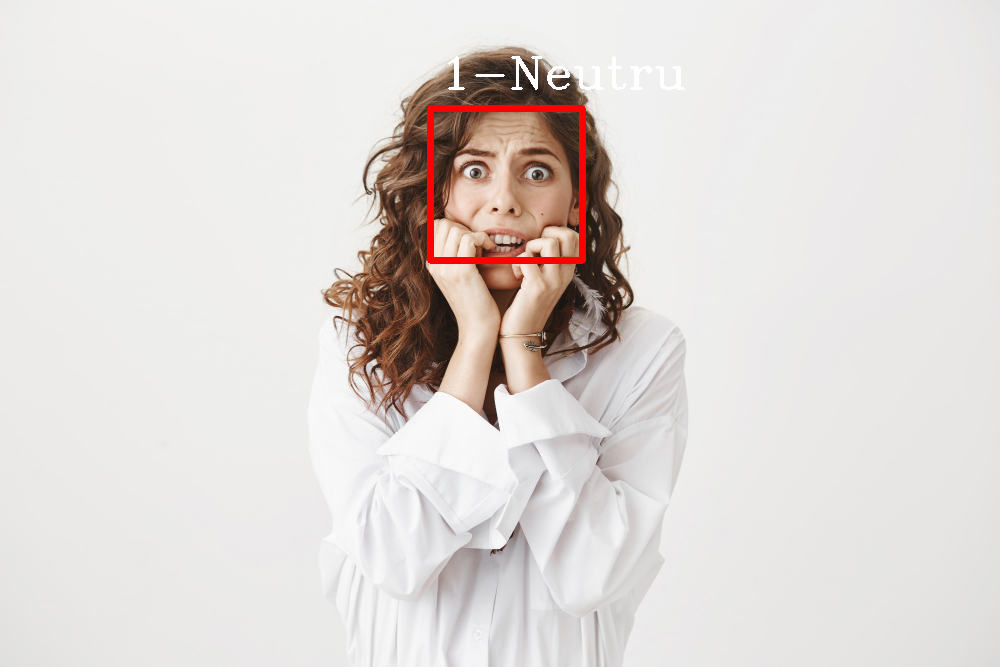

Procesează imaginea: images/test/test_11.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 18ms/step
Persoana:  1  :  Fericit


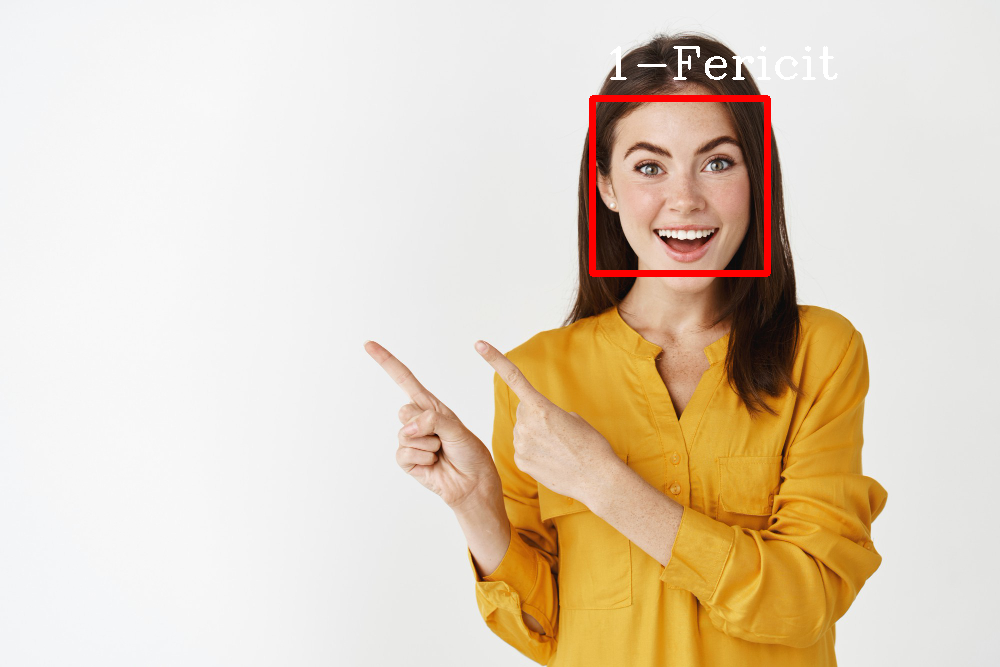

Procesează imaginea: images/test/test_12.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 17ms/step
Persoana:  1  :  Neutru


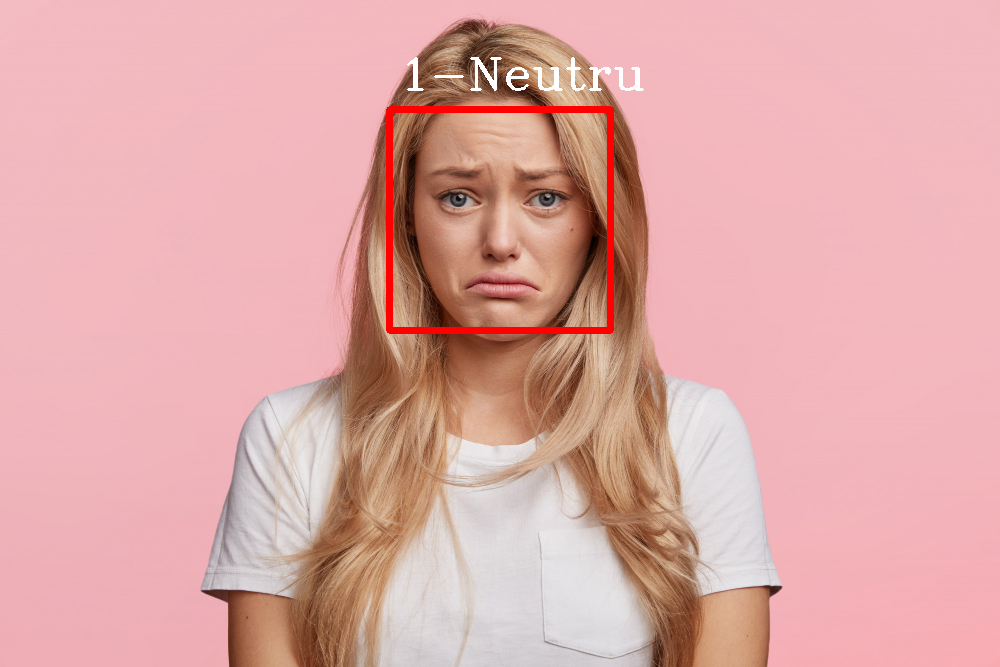

Procesează imaginea: images/test/test_13.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 17ms/step
Persoana:  1  :  Infricosat


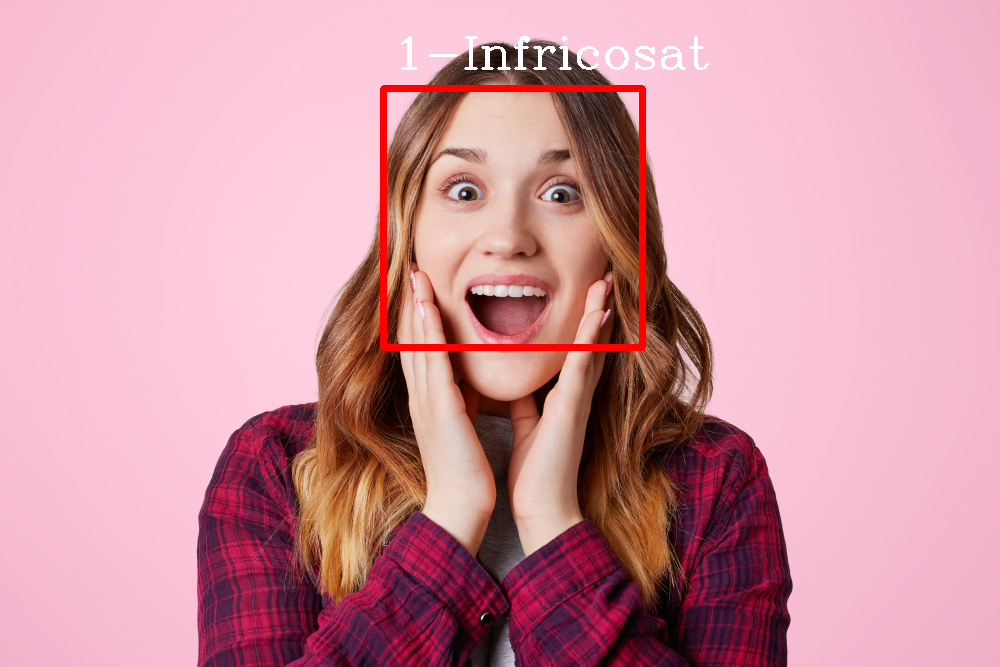

Procesează imaginea: images/test/test_14.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 19ms/step
Persoana:  1  :  Neutru


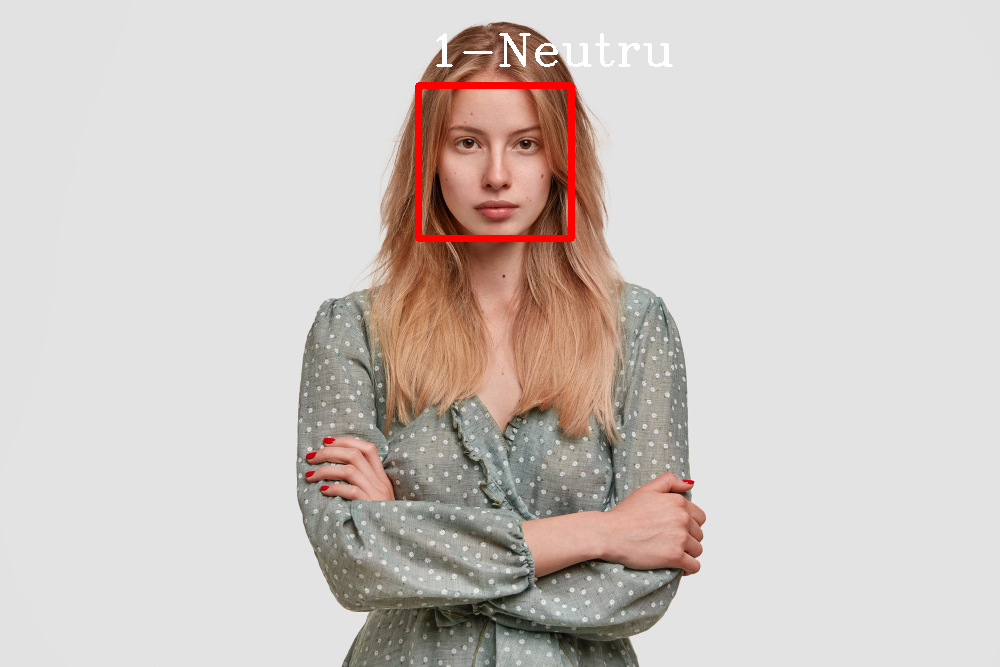

Procesează imaginea: images/test/test_15.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 20ms/step
Persoana:  1  :  Furios


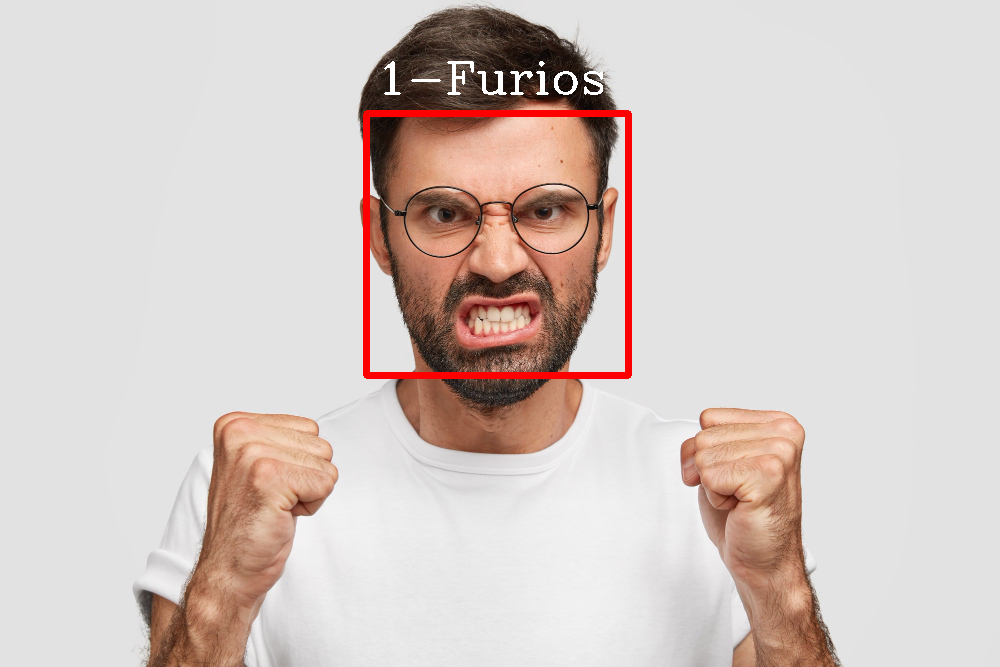

Procesează imaginea: images/test/test_16.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 25ms/step
Persoana:  1  :  Furios


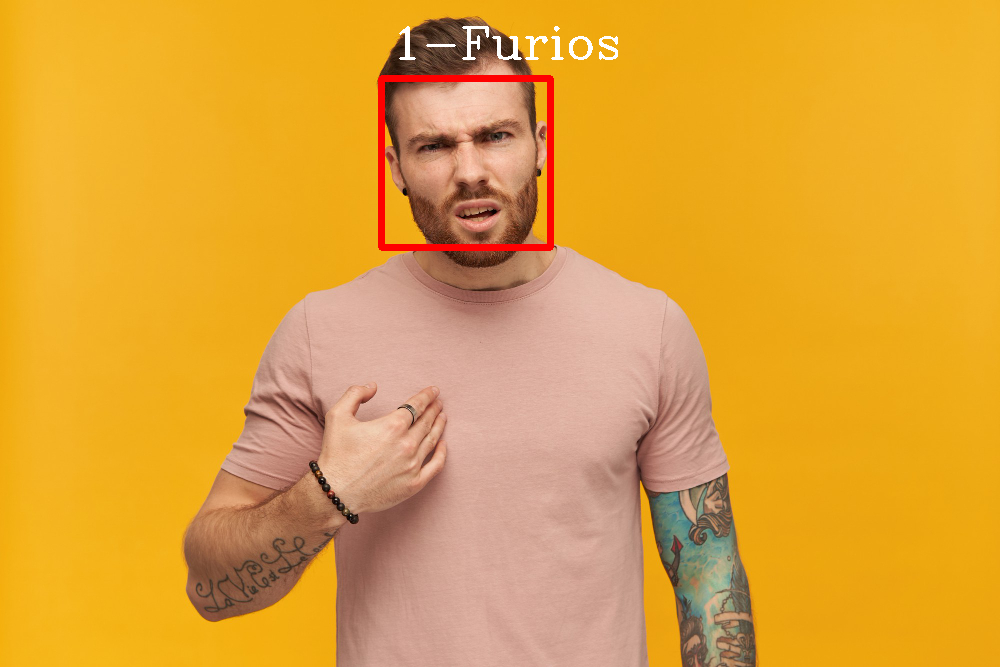

Procesează imaginea: images/test/test_17.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 17ms/step
Persoana:  1  :  Furios


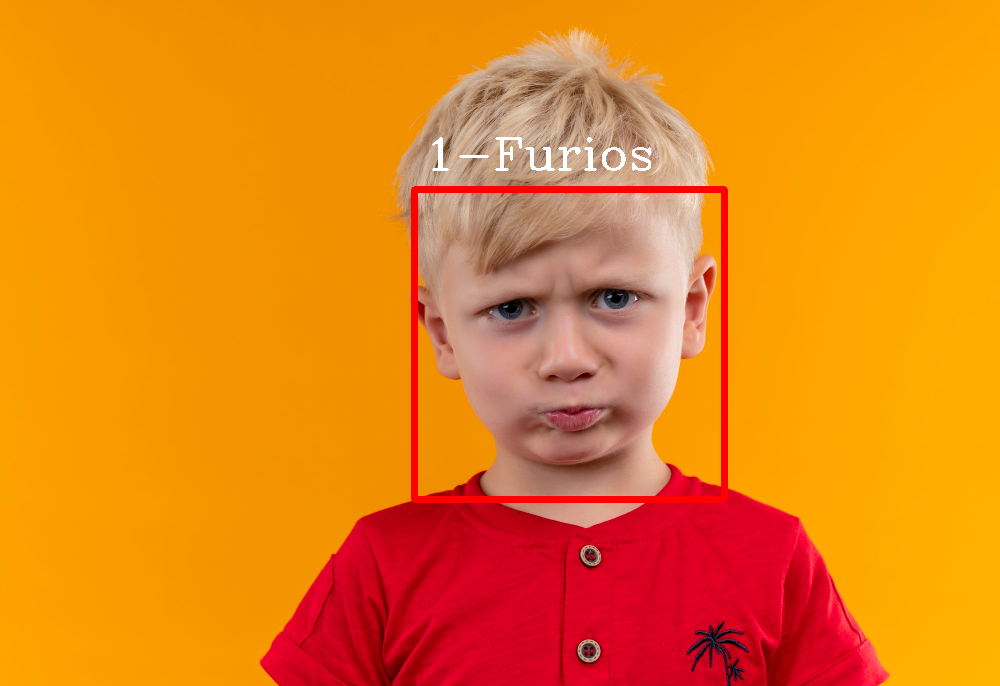

Procesează imaginea: images/test/test_18.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 30ms/step
Persoana:  1  :  Trist


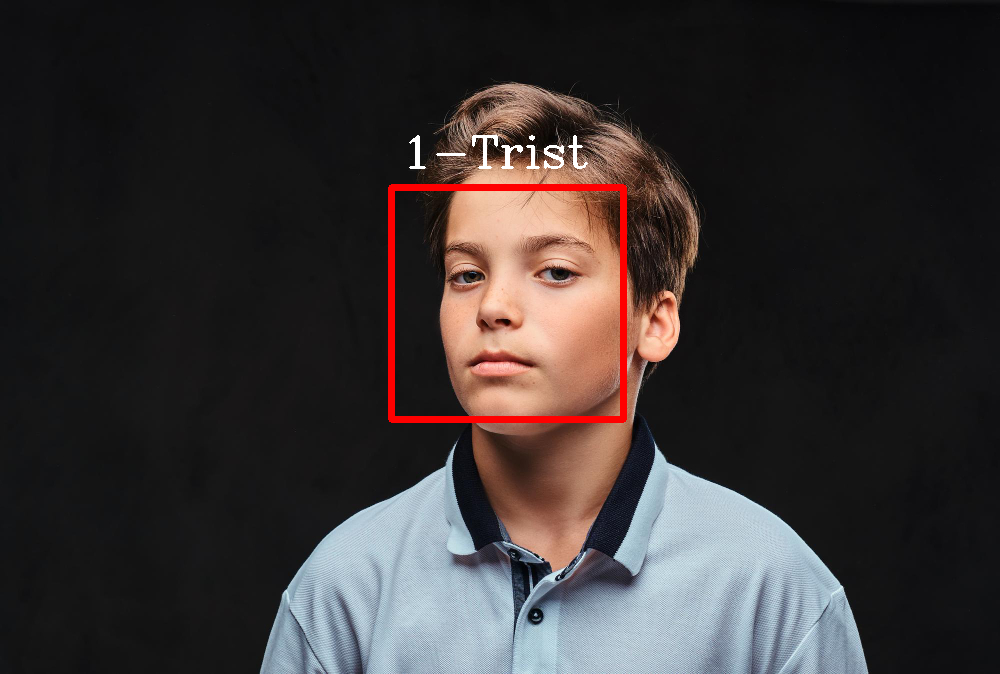

Procesează imaginea: images/test/test_19.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 25ms/step
Persoana:  1  :  Neutru


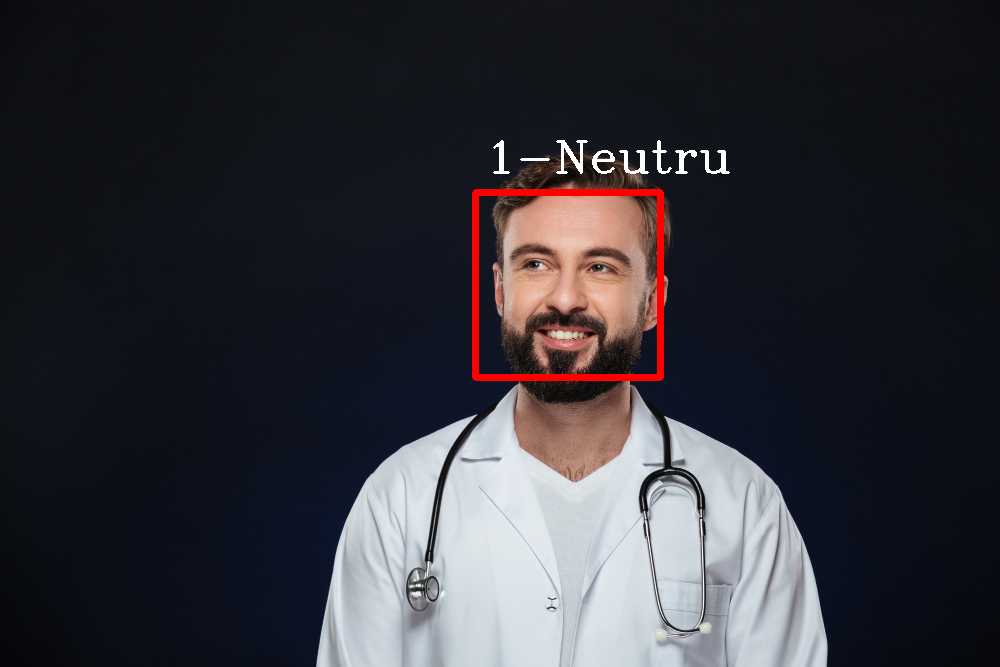

Procesează imaginea: images/test/test_20.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 17ms/step
Persoana:  1  :  Trist


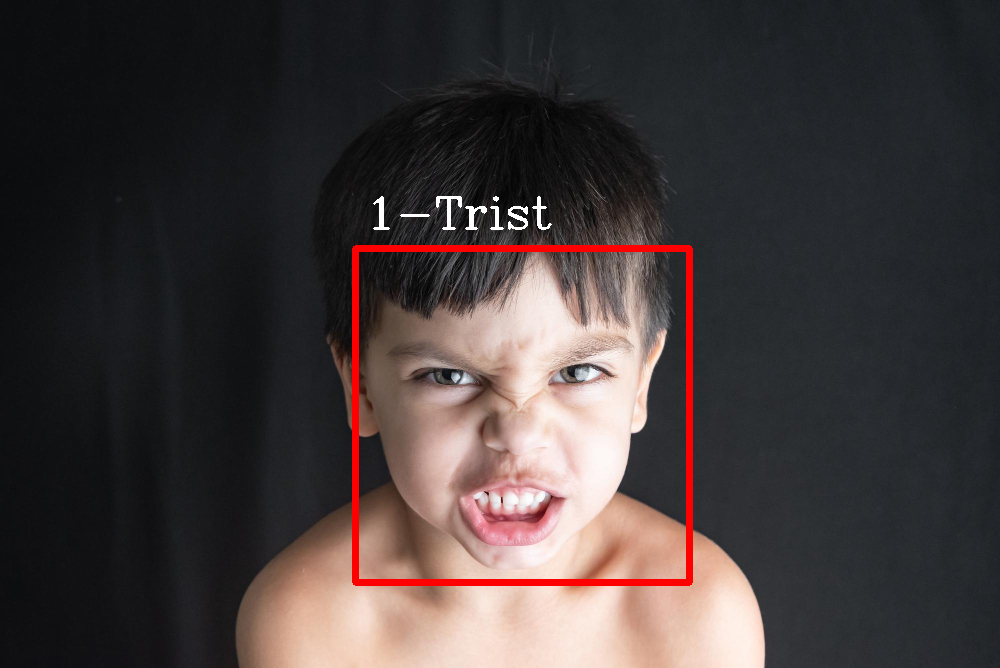

Procesează imaginea: images/test/test_21.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 18ms/step
Persoana:  1  :  Surprins


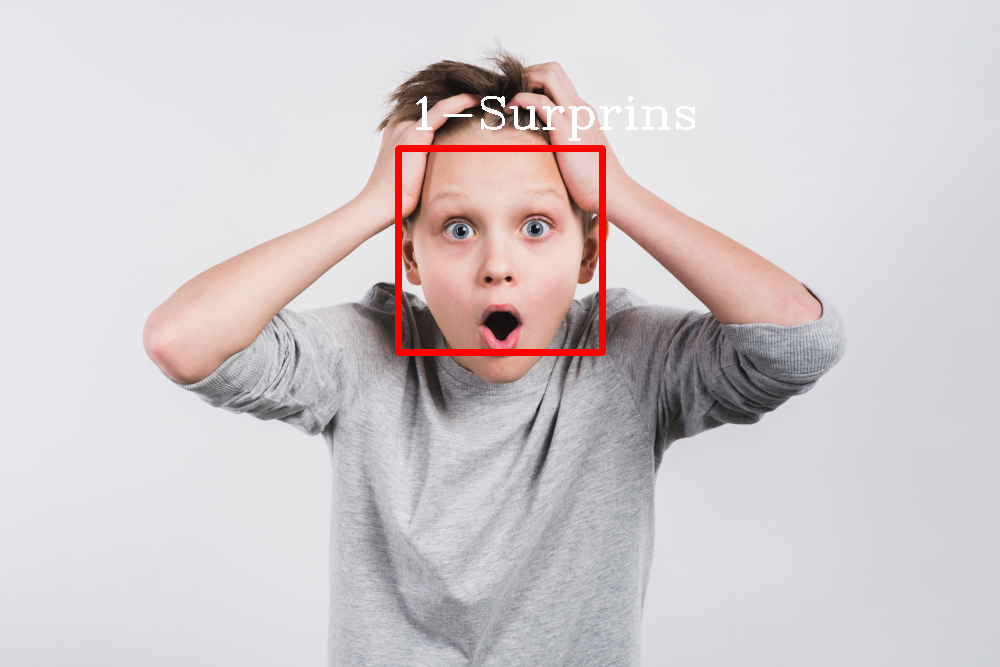

Procesează imaginea: images/test/test_22.jpg
Numărul de fețe din imagine:  1
1/1 [==============================] - 0s 18ms/step
Persoana:  1  :  Fericit


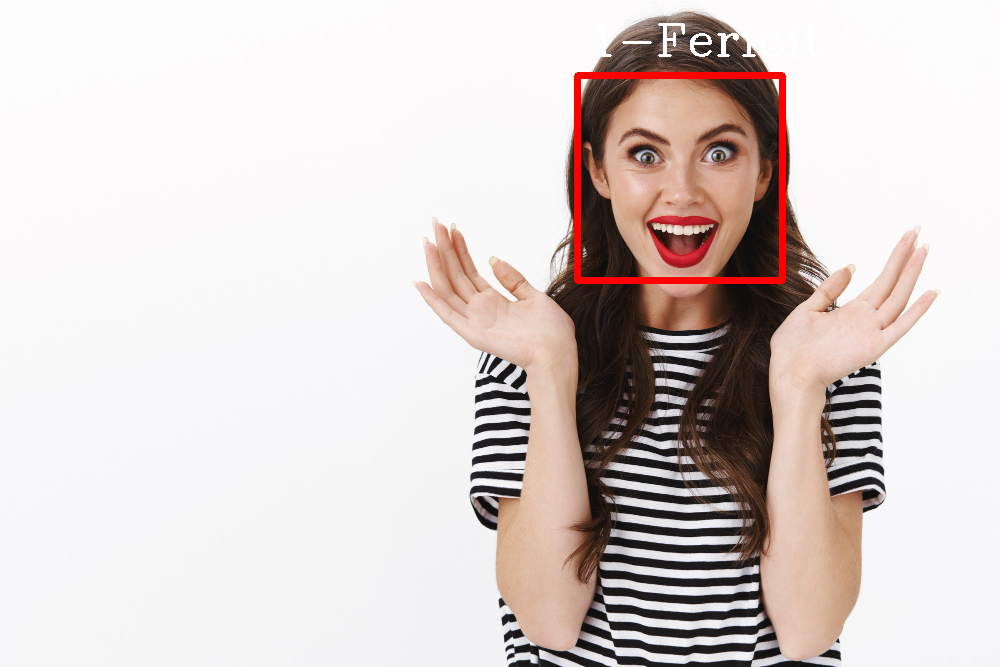

In [91]:
# Teste
# Imaginile de test sunt preluate de pe https://www.freepik.com/
for i in range(1,23):
    image_path = f"images/test/test_{i}.jpg"
    print(f"Procesează imaginea: {image_path}")
    predict_from_image(image_path)